# CarND Project 4

---

The goals / steps of this project are the following:

- Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
- Apply a distortion correction to raw images.
- Use color transforms, gradients, etc., to create a thresholded binary image.
- Apply a perspective transform to rectify binary image ("birds-eye view").
- Detect lane pixels and fit to find the lane boundary.
- Determine the curvature of the lane and vehicle position with respect to center.
- Warp the detected lane boundaries back onto the original image.
- Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.


### Camera calibration and undistortion on chessboard images

In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob

#%matplotlib qt
%matplotlib inline

In [2]:
# read all chessboards images
images = glob.glob('./camera_cal/calibration*.jpg')

# prepare object points
objp = np.zeros((6*9,3),np.float32)
objp[:,:2] = np.mgrid[0:9, 0:6].T.reshape(-1,2)

# object points and image points arrays
objpoints = []
imgpoints = []

for fname in images:
    img = mpimg.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    ret, corners = cv2.findChessboardCorners(gray, (9, 6), None)
    if ret == True:
        imgpoints.append(corners)
        objpoints.append(objp)
        
        img = cv2.drawChessboardCorners(img, (9, 6), corners, ret)
        
        ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)

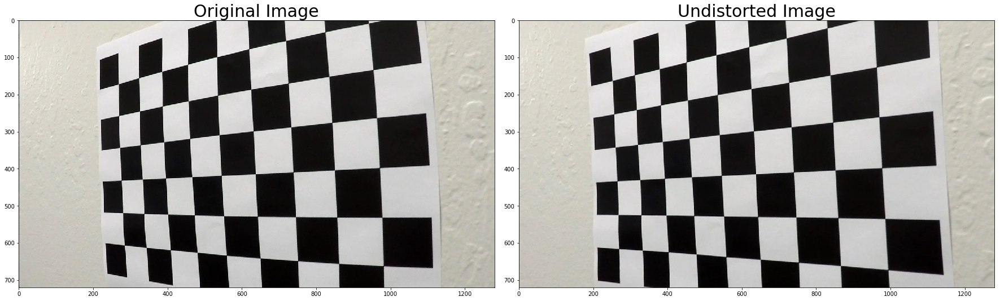

In [3]:
# Camera calibration example

img = mpimg.imread('./camera_cal/calibration4.jpg')
undist = cv2.undistort(img, mtx, dist, None, mtx)
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(undist)
ax2.set_title('Undistorted Image', fontsize=30)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

### Distortion correction on test images

In [4]:
def cal_undistort(img, mtx, dist):
    undist = cv2.undistort(img, mtx, dist, None, mtx)http://localhost:8888/notebooks/mac/CarND-p4/p4_cl-Copy1.ipynb#Distortion-correction-on-test-images
    return undist

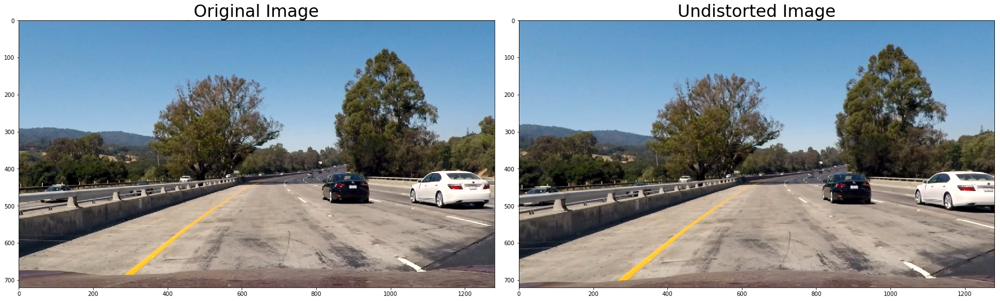

In [5]:
img = mpimg.imread('./test_images/test1.jpg')
undistort = cal_undistort(img,mtx,dist)
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(undistort)
ax2.set_title('Undistorted Image', fontsize=30)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

### Use color transforms, gradients, etc., to create a thresholded binary image.

In [6]:
# Define a function that applies Sobel x or y, 
# then takes an absolute value and applies a threshold.
def abs_sobel_thresh(img, orient='x', sobel_kernel=3, sobel_thresh=(0, 255)):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Apply x or y gradient with the OpenCV Sobel() function
    # and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0, sobel_kernel))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1, sobel_kernel))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
    binary_output[(scaled_sobel >= sobel_thresh[0]) & (scaled_sobel <= sobel_thresh[1])] = 1

    # Return the result
    return binary_output

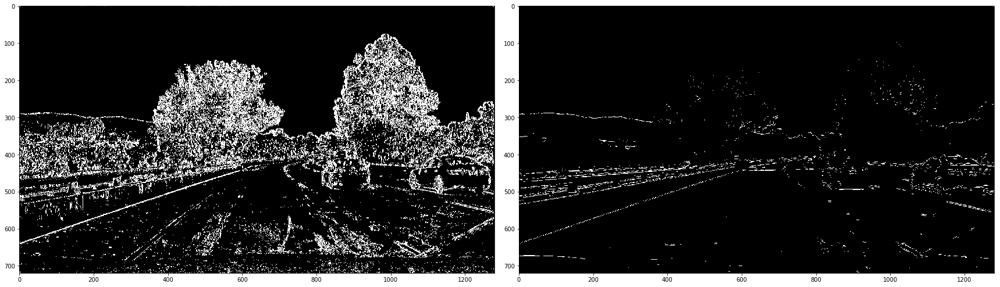

In [7]:
# Test Soble operation
img = mpimg.imread('./test_images/test1.jpg')
grad_binary_x = abs_sobel_thresh(img, orient='x', sobel_kernel=5, sobel_thresh=(10,100))
grad_binary_y = abs_sobel_thresh(img, orient='y', sobel_kernel=5, sobel_thresh=(60,100))
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(grad_binary_x, cmap='gray')
ax2.imshow(grad_binary_y, cmap='gray')

In [8]:
# Define a function that applies Sobel x and y, 
# then computes the magnitude of the gradient
# and applies a threshold
def mag_thresh(img, sobel_kernel=9, mag_thresh=(30, 100)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, sobel_kernel)
    # 3) Calculate the magnitude 
    #abs_sobelxy = np.hypot(sobelx,sobely)
    abs_sobelxy = np.sqrt(np.square(sobelx) + np.square(sobely))
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scale_factor = np.max(abs_sobelxy)/255 
    abs_sobelxy = (abs_sobelxy/scale_factor).astype(np.uint8) 
    # 5) Create a binary mask where mag thresholds are met
    binary_output = np.zeros_like(abs_sobelxy)
    binary_output[(abs_sobelxy >= mag_thresh[0]) & (abs_sobelxy <= mag_thresh[1])] = 1
    # 6) Return this mask as your binary_output image
    #binary_output = np.copy(img) # Remove this line
    return binary_output

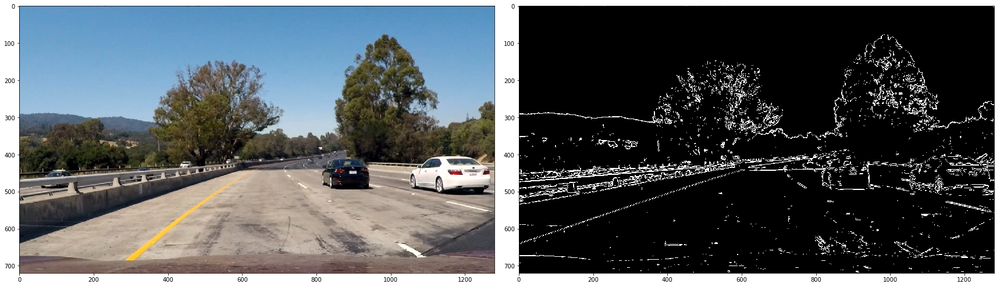

In [9]:
# Test Magnitude
img = mpimg.imread('./test_images/test1.jpg')
mag_img = mag_thresh(img, sobel_kernel=5, mag_thresh=(40,100))
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax2.imshow(mag_img, cmap='gray')

In [10]:
# Define a function that applies Sobel x and y, 
# then computes the direction of the gradient
# and applies a threshold.
def direction(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    # 3) Take the absolute value of the x and y gradients
    abs_sobelx = np.sqrt(sobelx*sobelx)
    abs_sobely = np.sqrt(sobely*sobely)
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    direction = np.arctan2(abs_sobely, abs_sobelx)
    # 5) Create a binary mask where direction thresholds are met
    binary_output =  np.zeros_like(direction)
    # 6) Return this mask as your binary_output image
    binary_output[(direction >= thresh[0]) & (direction <= thresh[1])] = 1
    return binary_output

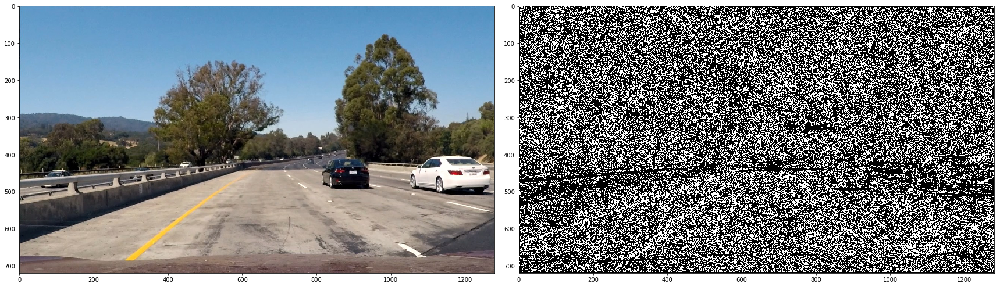

In [11]:
# Test direction of the gradient
img = mpimg.imread('./test_images/test1.jpg')
dir_img = direction(img, sobel_kernel=5, thresh=(0.7,1.3))
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax2.imshow(dir_img, cmap='gray')

In [12]:
def hls_select(img, thresh=(0, 255)):
    # 1) Convert to HLS color space
    hls = cv2.cvtColor(img,cv2.COLOR_RGB2HLS)
    # 2) Apply a threshold to the S channel
    # 3) Return a binary image of threshold result
    img_s = hls[:,:,2]
    binary_output=np.zeros_like(img_s)
    binary_output[(img_s>thresh[0]) & (img_s<=thresh[1])]=1
    return binary_output

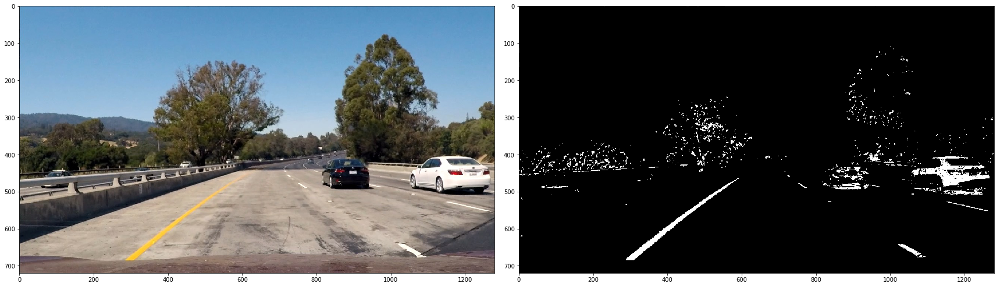

In [13]:
# Test HLS color threshold
img = mpimg.imread('./test_images/test1.jpg')
hls = hls_select(img, thresh=(150, 255))
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax2.imshow(hls, cmap='gray')

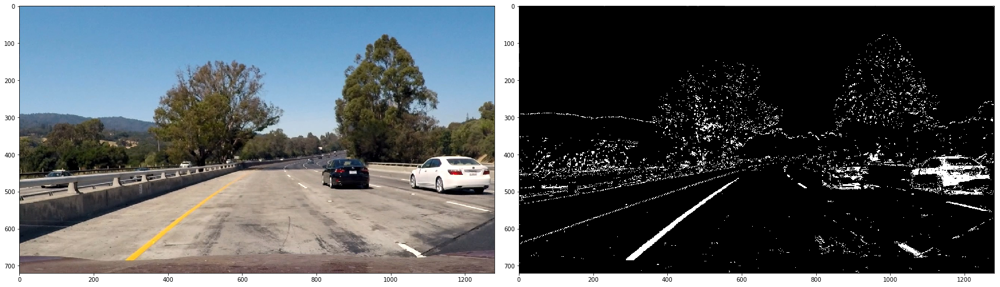

In [14]:
# Test combined x and y Sobel operation, magnitude, direction and color selection
combined = np.zeros_like(dir_img)
combined[((grad_binary_x == 1) & (grad_binary_y == 1)) | ((mag_img == 1) & (dir_img == 1))] = 1
combined_col = np.zeros_like(combined)
combined_col[(hls>0)|(combined>0)] = 1
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax2.imshow(combined_col, cmap='gray')

### Perspective transform (bird's eye view)

Create a mask covering a region of interst (lane lines only), and convert this region to an up-down view in order to determine the curvature.

In [15]:
# Define a function to create the mask
def mask_img(img):
    img = img.astype(np.uint8)
    height = img.shape[0]
    width = img.shape[1]
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    vertices = np.array([[(width/6,height),
                         (width/2,height*5/9),
                         (width*3/5,height*5/9),
                         (width*15/16,height)]],dtype=np.int32)
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

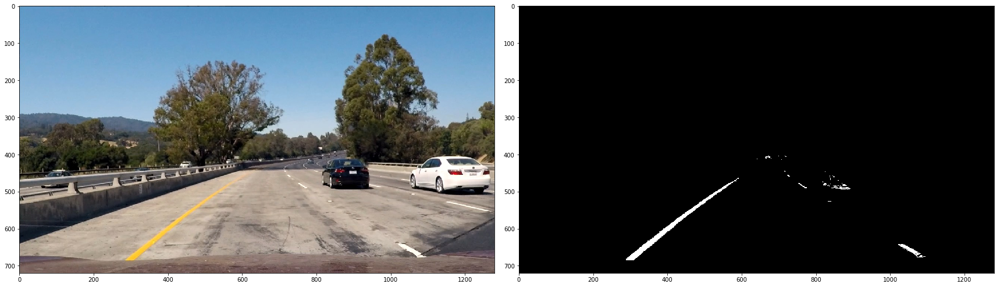

In [16]:
masked = mask_img(hls)
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax2.imshow(masked, cmap='gray')

In [17]:
# define a function that applies perspective transform
def pt(img):
    #img = np.copy(img)
    #img = img.astype(np.uint8)
    height = img.shape[0]
    width = img.shape[1]
    # Define src and dst matrix
    src = np.float32([
        [250, 680],
        [1050, 680],
        [585, 455],
        [695, 455]
    ])
    dst = np.float32([
        [335, 700],
        [950, 700],
        [330, 0],
        [945, 0]
    ])
    # Compute and apply perpective transform
    M = cv2.getPerspectiveTransform(src, dst)
    warped = cv2.warpPerspective(img, M, (width, height), flags=cv2.INTER_NEAREST)  
    return warped, dst, src

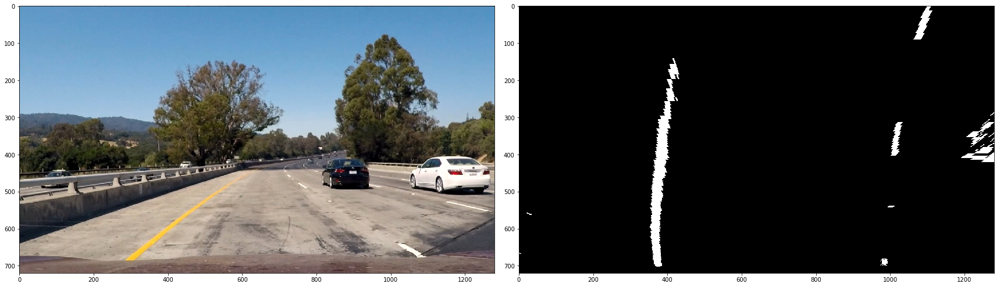

In [18]:
# Test bird's eye view on color selected image
bird, dst, src = pt(hls)
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax2.imshow(bird, cmap='gray')

### Detect lane pixels and fit to find the lane boundary

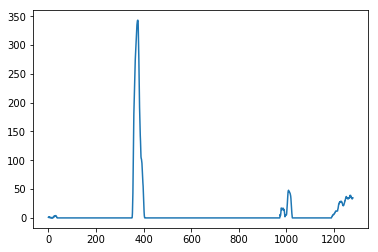

In [19]:
histogram_ex = np.sum(bird[bird.shape[0]//2:,:], axis=0)
plt.plot(histogram_ex)

In [20]:
def sliding(img):
    histogram = np.sum(img[img.shape[0]//2:,:], axis=0)
    out_img = np.dstack((img, img, img))*255
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    nwindows = 9
    window_height = np.int(img.shape[0]/nwindows)
    nonzero = img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    leftx_current = leftx_base
    rightx_current = rightx_base
    margin = 100
    minpix = 50
    left_lane_inds = []
    right_lane_inds = []
    
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = img.shape[0] - (window+1)*window_height
        win_y_high = img.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]

        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position

        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

        #print (win_y_low, win_y_high, win_xleft_low, win_xleft_high, win_xright_low, win_xright_high)

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    ploty = np.linspace(0, img.shape[0]-1, img.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    
    return out_img, left_fitx, right_fitx, ploty, leftx_base, rightx_base

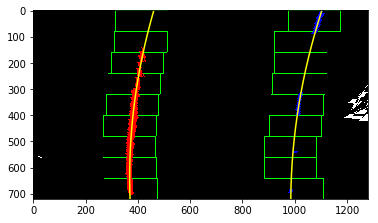

In [21]:
out_img, left_fitx, right_fitx, ploty, leftx_base, rightx_base = sliding(bird)
plt.imshow(out_img)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')

### Determine the curvature of the lane and vehicle position with respect to center.

In [22]:
# calculate curvature of the lane
def curvature(left_fitx, right_fitx, ploty):
    y_eval = np.max(ploty)
    
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension

    #print('ploty.shape[0] = ', ploty.shape[0])
    #print('leftx.shape[0] = ', left_fitx.shape[0])
    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty*ym_per_pix, left_fitx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, right_fitx*xm_per_pix, 2)
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    return left_curverad, right_curverad

In [23]:
# calculate vehicle position with respect to lane center
def position(img, leftx_base, rightx_base):
    center = img.shape[1]/2
    lane_center = (leftx_base + rightx_base) / 2
    xm_per_pix = 3.7/700
    offset = (center - lane_center) * xm_per_pix
    return offset

### Warp the detected lane boundaries back onto the original image.

In [24]:
def map_lane(img, undist, left_fitx, right_fitx, ploty, src, dst, leftx_base, rightx_base):
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(img).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    Minv = cv2.getPerspectiveTransform(dst, src)
    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (undist.shape[1], undist.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)
    
    # calculate offset and curvature
    offset = position(img, leftx_base, rightx_base)
    left_curverad, right_curverad = curvature(left_fitx, right_fitx, ploty)

    cv2.putText(result, 'Left radius:  {:10.1f} (m)'.format(left_curverad), (50,50), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), 2)
    cv2.putText(result, 'Right radius: {:10.1f} (m)'.format(right_curverad),(50,90), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), 2)
    cv2.putText(result, 'Vehicle offset:   {:7.1f} (m)'.format(offset), (50,130), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), 2)
    
    return result 

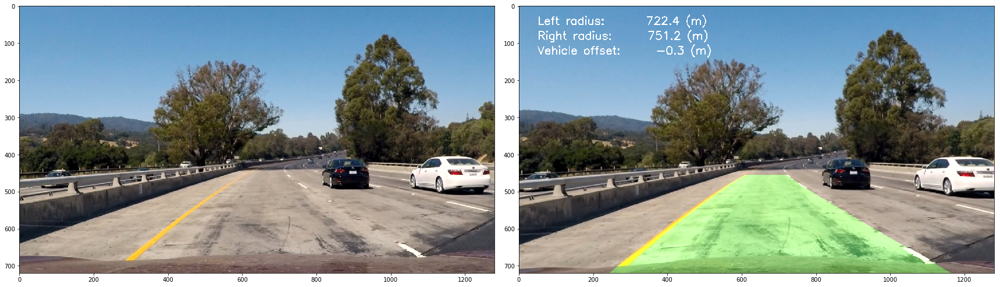

In [25]:
output  = map_lane(bird, undistort, left_fitx, right_fitx, ploty, src, dst, leftx_base, rightx_base)
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax2.imshow(output)

### Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position

In [26]:
def pipeline(img):

    undistort = cal_undistort(img, mtx, dist)

    hls = hls_select(undistort, thresh=(150, 255))

    grad_binary_x = abs_sobel_thresh(img, orient='x', sobel_kernel=5, sobel_thresh=(10,100))
    
    grad_binary_y = abs_sobel_thresh(img, orient='y', sobel_kernel=5, sobel_thresh=(60,100))

    mag_img = mag_thresh(img, sobel_kernel=5, mag_thresh=(40,100))

    dir_img = direction(img, sobel_kernel=5, thresh=(0.7,1.3))

    combined = np.zeros_like(dir_img)

    combined[((grad_binary_x == 1) & (grad_binary_y == 1)) | ((mag_img == 1) & (dir_img == 1))] = 1

    combined_col = np.zeros_like(combined)

    combined_col[(hls>0)|(combined>0)] = 1
    
    masked = mask_img(combined_col)

    bird, dst, src = pt(combined_col)

    out_img, left_fitx, right_fitx, ploty, leftx_base, rightx_base = sliding(bird)

    left_curverad, right_curverad = curvature(left_fitx, right_fitx, ploty)

    offset = position(bird, leftx_base, rightx_base)

    output  = map_lane(bird, undistort, left_fitx, right_fitx, ploty, src, dst, leftx_base, rightx_base)

    return output

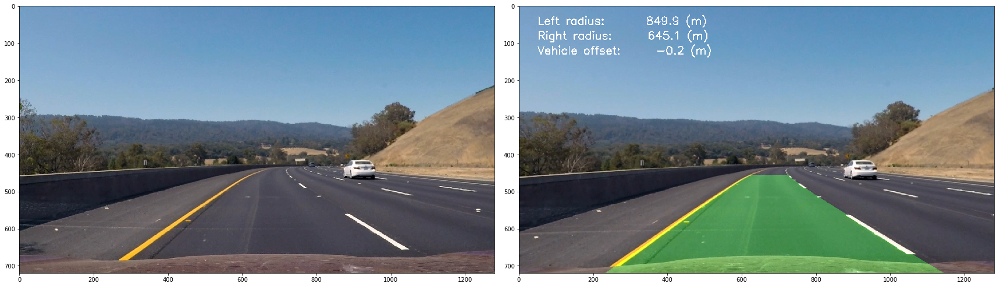

In [27]:
# test pipeline on a test image
img = mpimg.imread('./test_images/test3.jpg')
output = pipeline(img)
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax2.imshow(output)

In [28]:
# test pipeline on a test video
from imageio.plugins import ffmpeg
from moviepy.editor import VideoFileClip
from IPython.display import HTML

video_output = './project_video_out.mp4'
clip1 = VideoFileClip("./project_video.mp4", audio=False)
video_clip = clip1.fl_image(pipeline) #NOTE: this function expects color images!!
%time video_clip.write_videofile(video_output, audio=False)

[MoviePy] >>>> Building video ./project_video_out.mp4
[MoviePy] Writing video ./project_video_out.mp4


100%|█████████████████████████████████████████████████████████████████████████████▉| 1260/1261 [04:34<00:00,  4.60it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: ./project_video_out.mp4 

Wall time: 4min 34s
